In [1]:
import os
import psutil
import torch
import subprocess

def print_system_specs():
    print("="*50)
    print("🛠️  CPU & RAM INFORMATION")
    print("="*50)
    
    # 1. CPU Count
    physical_cores = psutil.cpu_count(logical=False)
    total_cores = psutil.cpu_count(logical=True)
    print(f"Physical Cores: {physical_cores}")
    print(f"Total Threads:  {total_cores}")

    # 2. CPU Model Name (Linux command)
    try:
        command = "cat /proc/cpuinfo | grep 'model name' | uniq"
        cpu_info = subprocess.check_output(command, shell=True).decode().strip()
        print(f"Model:          {cpu_info.split(': ')[1]}")
    except Exception as e:
        print(f"Model:          Could not retrieve ({e})")

    # 3. System Memory (RAM)
    ram_gb = psutil.virtual_memory().total / (1024 ** 3)
    print(f"Total RAM:      {ram_gb:.2f} GB")

    print("\n" + "="*50)
    print("🚀  GPU INFORMATION")
    print("="*50)

    # 4. GPU Check
    if torch.cuda.is_available():
        print(f"GPU Available:  YES")
        print(f"GPU Name:       {torch.cuda.get_device_name(0)}")
        print(f"Device Count:   {torch.cuda.device_count()}")
        print(f"CUDA Version:   {torch.version.cuda}")
        
        print("\n--- NVIDIA-SMI MEMORY DETAILS ---")
        try:
            # This runs the terminal command 'nvidia-smi' to get the memory map
            print(subprocess.check_output(["nvidia-smi"]).decode("utf-8"))
        except:
            print("Could not run nvidia-smi.")
    else:
        print("GPU Available:  NO")
        print("Note: Ensure 'Accelerator' is set to GPU in the Notebook settings.")

if __name__ == "__main__":
    print_system_specs()

🛠️  CPU & RAM INFORMATION
Physical Cores: 2
Total Threads:  4
Model:          Intel(R) Xeon(R) CPU @ 2.20GHz
Total RAM:      31.35 GB

🚀  GPU INFORMATION
GPU Available:  NO
Note: Ensure 'Accelerator' is set to GPU in the Notebook settings.


# INSTALLING REQUIRED PACKAGES

In [2]:
!pip install timm efficientnet-pytorch scikit-image seaborn
print("✅ All packages installed successfully!")

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16426 sha256=a6ee70f0286a948c49e7839ff65d54c77caf9258ea16a42ab1ac846c9ead5038
  Stored in directory: /root/.cache/pip/wheels/9c/3f/43/e6271c7026fe08c185da2be23c98c8e87477d3db63f41f32ad
Successfully built efficientnet-pytorch
✅ All packages installed successfully!


# IMPORTING LIBRARIES

In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import shutil
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from timm import create_model
from efficientnet_pytorch import EfficientNet
import json
from datetime import datetime
from tqdm.auto import tqdm
import time
import random
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns

/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

# Checking GPU Availibility 

In [4]:
np.random.seed(42)
torch.manual_seed(42)
random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
    torch.cuda.manual_seed_all(42)

print("✅ Libraries imported!")
print(f"🔥 PyTorch: {torch.__version__}")
print(f"🎮 CUDA: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"🚀 GPUs: {torch.cuda.device_count()}")
    for i in range(torch.cuda.device_count()):
        print(f"   GPU {i}: {torch.cuda.get_device_name(i)}")

✅ Libraries imported!
🔥 PyTorch: 2.8.0+cu126
🎮 CUDA: False


# CONFIGURATION

In [5]:
class Config:
    # Paths
    BASE_PATH = '/kaggle/input/endodata/Colab Notebooks Dataset'
    OUTPUT_BASE = '/kaggle/working/Endometrial_Results'
    
    # Classes
    CLASSES = ['EA', 'EH', 'EP', 'NE']

    # Models
    MODELS_TO_TRAIN = ['ResNet50', 'ConvNeXt', 'Swin', 'MaxViT']
    
    # Image size (224x224 for pretrained models)
    FINAL_SIZE = (224, 224)
    
    # Data split
    TRAIN_RATIO = 0.7
    TEST_RATIO = 0.2
    VAL_RATIO = 0.1
    
    # Training
    BATCH_SIZE = 16
    EPOCHS = 50
    LEARNING_RATE = 5e-5
    WEIGHT_DECAY = 1e-5
    
    # Augmentation
    TRAIN_AUG_MULTIPLIER = 2  # 2x for training
    VAL_AUG_MULTIPLIER = 1    # 1x for validation
    
    @classmethod
    def create_output_dirs(cls):
        dirs = [
            cls.OUTPUT_BASE,
            f'{cls.OUTPUT_BASE}/01_preprocessing',
            f'{cls.OUTPUT_BASE}/02_segmentation',
            f'{cls.OUTPUT_BASE}/03_split_data',
            f'{cls.OUTPUT_BASE}/04_models',
            f'{cls.OUTPUT_BASE}/05_results'
        ]
        for d in dirs:
            os.makedirs(d, exist_ok=True)

config = Config()
config.create_output_dirs()
print("✅ Configuration ready!")

✅ Configuration ready!


# PREPROCESSOR

In [6]:
class Preprocessor:
    """Conservative preprocessing - preserves image quality"""
    
    def __init__(self, config):
        self.config = config
    
    def preprocess(self, image):
        """Minimal preprocessing pipeline"""
        original = image.copy()
        
        # 1. Normalize to 0-1
        img_float = image.astype(np.float32) / 255.0
        
        # 2. Mild contrast (1.05x)
        adjusted = np.clip(img_float * 1.05 + 0.02, 0, 1)
        
        # 3. Gentle denoising (bilateral filter)
        adjusted_uint8 = (adjusted * 255).astype(np.uint8)
        denoised = cv2.bilateralFilter(adjusted_uint8, d=3, sigmaColor=10, sigmaSpace=10)
        
        # Calculate quality metrics
        psnr_val = psnr(original, denoised, data_range=255)
        ssim_val = ssim(original, denoised, data_range=255, channel_axis=2, win_size=3)
        
        return denoised, psnr_val, ssim_val
    
    def visualize(self, original, processed, psnr_val, ssim_val, save_path, name):
        """Side-by-side comparison"""
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        axes[0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        axes[0].set_title(f'Original\n{original.shape[1]}x{original.shape[0]}', fontsize=12)
        axes[0].axis('off')
        
        axes[1].imshow(cv2.cvtColor(processed, cv2.COLOR_BGR2RGB))
        axes[1].set_title(f'Preprocessed\nPSNR: {psnr_val:.2f}dB | SSIM: {ssim_val:.4f}', fontsize=12)
        axes[1].axis('off')
        
        plt.suptitle(f'Conservative Preprocessing - {name}', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        plt.close()

preprocessor = Preprocessor(config)
print("✅ Preprocessor ready!")

✅ Preprocessor ready!


# WATERSHED SEGMENTER

In [7]:
class WatershedSegmenter:
    """Watershed with visible boundaries"""
    
    def __init__(self, config):
        self.config = config
    
    def segment(self, image):
        """Apply watershed segmentation"""
        # Grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        # Otsu threshold
        _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        
        # Morphology
        kernel = np.ones((3, 3), np.uint8)
        opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
        sure_bg = cv2.dilate(opening, kernel, iterations=3)
        
        # Distance transform
        dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
        _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
        sure_fg = np.uint8(sure_fg)
        
        # Unknown region
        unknown = cv2.subtract(sure_bg, sure_fg)
        
        # Markers
        _, markers = cv2.connectedComponents(sure_fg)
        markers = markers + 1
        markers[unknown == 255] = 0
        
        # Watershed
        markers = cv2.watershed(image, markers)
        
        # Highlight boundaries
        result = image.copy()
        result[markers == -1] = [255, 0, 0]  
        
        # Draw contours
        boundary_mask = np.zeros_like(gray)
        boundary_mask[markers == -1] = 255
        contours, _ = cv2.findContours(boundary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(result, contours, -1, (0, 255, 255), 2)  
        
        return result
    
    def visualize(self, original, segmented, save_path, name):
        """Side-by-side comparison"""
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        axes[0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        axes[0].set_title('Preprocessed', fontsize=12)
        axes[0].axis('off')
        
        axes[1].imshow(cv2.cvtColor(segmented, cv2.COLOR_BGR2RGB))
        axes[1].set_title('Watershed\n(Cyan/Yellow = Boundaries)', fontsize=12)
        axes[1].axis('off')
        
        plt.suptitle(f'Watershed Segmentation - {name}', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        plt.close()

segmenter = WatershedSegmenter(config)
print("✅ Segmenter ready!")

✅ Segmenter ready!


# VISUALIZING PROCESSED IMAGE


📸 VISUALIZING SAMPLE PROCESSING (INLINE)

🎯 Processing and displaying 10 samples...



Samples:   0%|          | 0/10 [00:00<?, ?it/s]

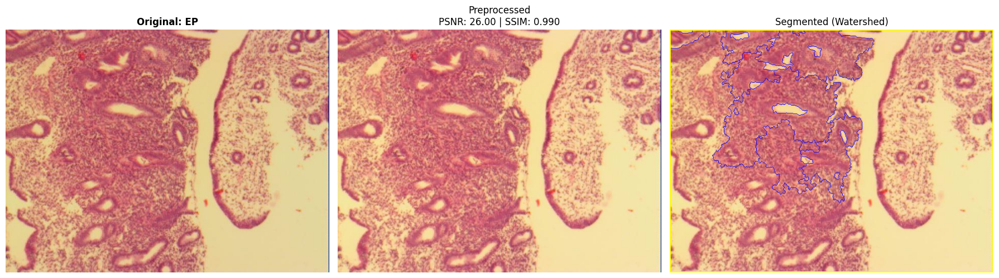

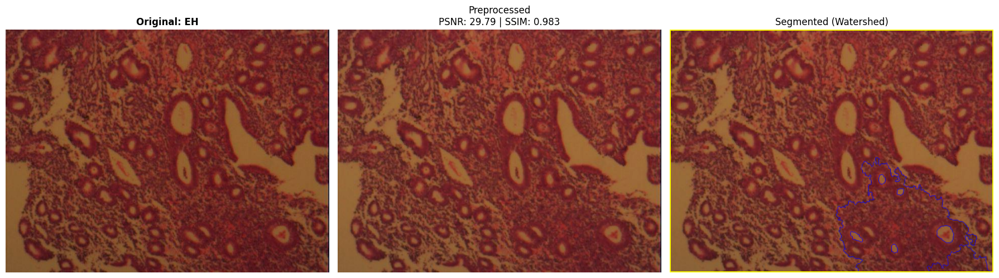

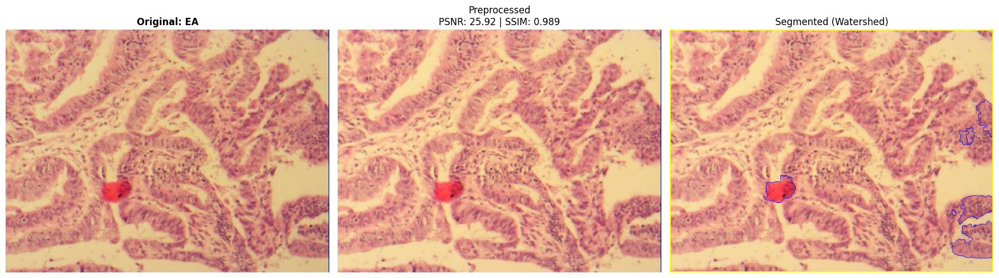

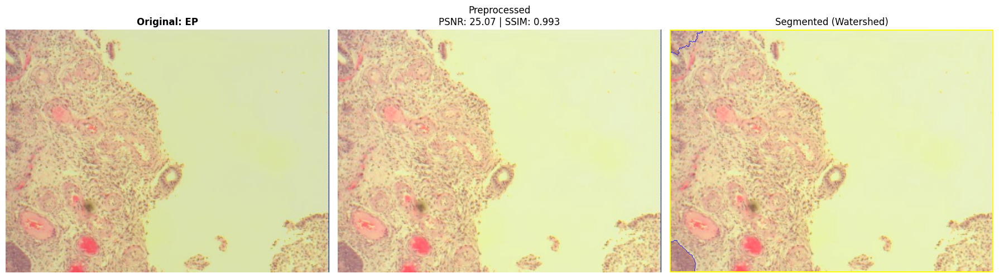

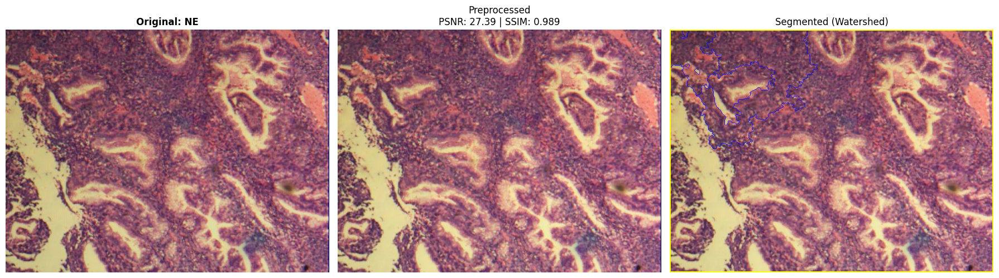

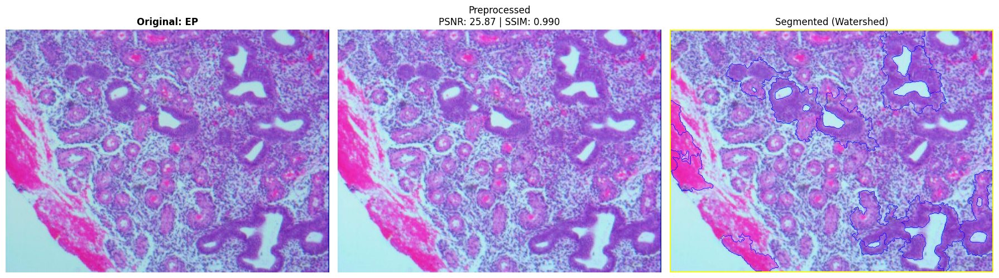

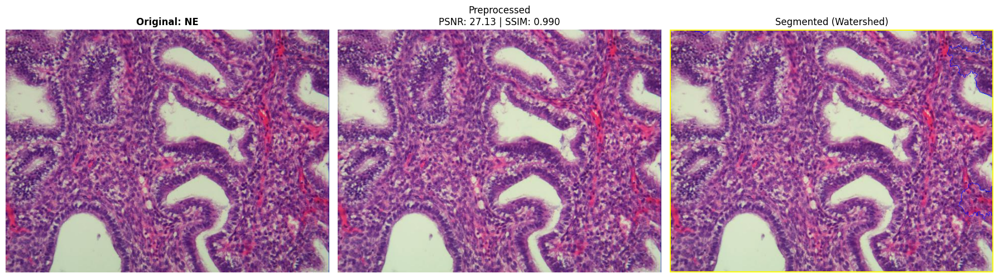

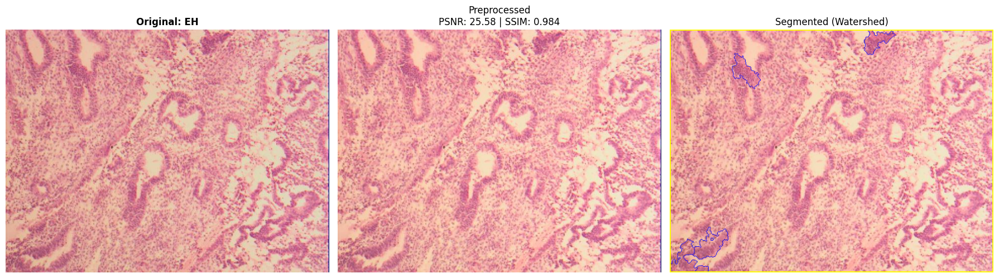

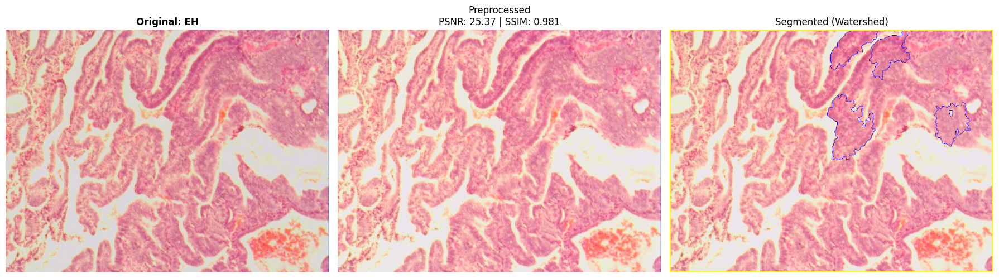

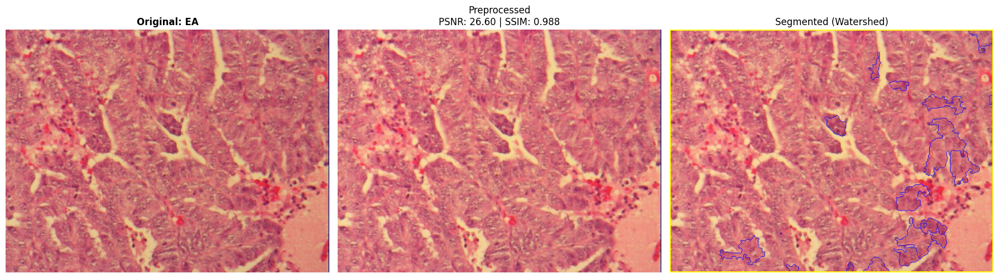


✅ Visualization complete!


In [8]:
print("\n" + "="*80)
print("📸 VISUALIZING SAMPLE PROCESSING (INLINE)")
print("="*80)

# Collect samples
samples = []
for cls in config.CLASSES:
    class_path = Path(config.BASE_PATH) / cls
    if class_path.exists():
        # Using iterdir() as you did
        all_files = list(class_path.iterdir())
        imgs = [f for f in all_files if f.is_file() and f.suffix.lower() in ['.jpg', '.png', '.jpeg']]
        if imgs:
            # Take 2 samples per class to keep output manageable
            samples.extend([(f, cls) for f in imgs[:3]])

random.shuffle(samples)
samples = samples[:min(10, len(samples))] 

print(f"\n🎯 Processing and displaying {len(samples)} samples...\n")

for img_path, cls in tqdm(samples, desc="Samples"):
    try:
        # Read Image (OpenCV reads in BGR)
        image = cv2.imread(str(img_path))
        if image is None:
            continue
        
        name = img_path.stem
        
        # 1. Preprocess
        processed, psnr_val, ssim_val = preprocessor.preprocess(image)
        
        # 2. Segment
        segmented = segmenter.segment(processed)
        
        # --- DISPLAY LOGIC (Changed from Saving to Plotting) ---
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        # Plot Original
        axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[0].set_title(f'Original: {cls}', fontsize=12, fontweight='bold')
        axes[0].axis('off')
        
        # Plot Preprocessed
        axes[1].imshow(cv2.cvtColor(processed, cv2.COLOR_BGR2RGB))
        axes[1].set_title(f'Preprocessed\nPSNR: {psnr_val:.2f} | SSIM: {ssim_val:.3f}', fontsize=12)
        axes[1].axis('off')
        
        # Plot Segmented
        axes[2].imshow(cv2.cvtColor(segmented, cv2.COLOR_BGR2RGB))
        axes[2].set_title('Segmented (Watershed)', fontsize=12)
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show() # This renders the image immediately in the notebook
        
    except Exception as e:
        print(f"Error processing {img_path}: {e}")

print("\n✅ Visualization complete!")

# PROCESSING FULL DATASET

In [9]:
print("\n" + "="*80)
print("🔬 PROCESSING FULL DATASET")
print("="*80)

processed_dir = f"{config.OUTPUT_BASE}/03_split_data/processed"
os.makedirs(processed_dir, exist_ok=True)

total = 0
counts = {}

for cls in config.CLASSES:
    class_path = Path(config.BASE_PATH) / cls
    if class_path.exists():
        all_files = list(class_path.iterdir())
        imgs = [f for f in all_files if f.is_file() and f.suffix.lower() in ['.jpg','.png','jpeg']]
        counts[cls] = len(imgs)
        total += len(imgs)

print(f"\n📊 Dataset:")
print(f"   Total: {total}")
for cls, cnt in counts.items():
    print(f"   {cls}: {cnt}")

with tqdm(total=total, desc="Processing", colour='green') as pbar:
    for cls in config.CLASSES:
        class_path = Path(config.BASE_PATH) / cls
        if not class_path.exists():
            continue
        all_files = list(class_path.iterdir())
        imgs = [f for f in all_files if f.is_file and f.suffix.lower() in ['.jpg','.jpeg','.png']]
        processed_imgs = []
        
        for img_path in imgs:
            try:
                image = cv2.imread(str(img_path))
                if image is None:
                    pbar.update(1)
                    continue
                
                # Preprocess + Segment
                processed, _, _ = preprocessor.preprocess(image)
                segmented = segmenter.segment(processed)
                
                # Resize to 224x224
                final = cv2.resize(segmented, config.FINAL_SIZE)
                processed_imgs.append(final)
                pbar.update(1)
                
            except Exception as e:
                pbar.update(1)
        
        # Save
        if processed_imgs:
            np.save(f"{processed_dir}/{cls}.npy", np.array(processed_imgs))
            print(f"\n   💾 {cls}: {len(processed_imgs)} saved")

print("\n✅ Full processing done!")


🔬 PROCESSING FULL DATASET

📊 Dataset:
   Total: 3302
   EA: 535
   EH: 798
   EP: 636
   NE: 1333


Processing:   0%|          | 0/3302 [00:00<?, ?it/s]


   💾 EA: 535 saved

   💾 EH: 798 saved

   💾 EP: 636 saved

   💾 NE: 1333 saved

✅ Full processing done!


# SPLITTING DATASET

In [10]:
print("\n" + "="*80)
print("📂 SPLITTING DATA")
print("="*80)

split_dir = f"{config.OUTPUT_BASE}/03_split_data"
for split in ['train', 'val', 'test']:
    os.makedirs(f"{split_dir}/{split}", exist_ok=True)

class_to_idx = {cls: idx for idx, cls in enumerate(config.CLASSES)}

splits = {
    'train': {'images': [], 'labels': []},
    'val': {'images': [], 'labels': []},
    'test': {'images': [], 'labels': []}
}

for cls in config.CLASSES:
    cls_file = f"{processed_dir}/{cls}.npy"
    if not os.path.exists(cls_file):
        continue
    
    images = np.load(cls_file)
    n = len(images)
    
    n_train = int(n * config.TRAIN_RATIO)
    n_test = int(n * config.TEST_RATIO)
    n_val = n - n_train - n_test
    
    idx = np.random.permutation(n)
    train_idx = idx[:n_train]
    test_idx = idx[n_train:n_train + n_test]
    val_idx = idx[n_train + n_test:]
    
    label = class_to_idx[cls]
    
    splits['train']['images'].extend([images[i] for i in train_idx])
    splits['train']['labels'].extend([label] * len(train_idx))
    
    splits['test']['images'].extend([images[i] for i in test_idx])
    splits['test']['labels'].extend([label] * len(test_idx))
    
    splits['val']['images'].extend([images[i] for i in val_idx])
    splits['val']['labels'].extend([label] * len(val_idx))
    
    print(f"   {cls}: Train={len(train_idx)}, Test={len(test_idx)}, Val={len(val_idx)}")

# Save
for split_name in ['train', 'val', 'test']:
    np.savez_compressed(
        f"{split_dir}/{split_name}/data.npz",
        images=np.array(splits[split_name]['images']),
        labels=np.array(splits[split_name]['labels'])
    )
    print(f"\n💾 {split_name.capitalize()}: {len(splits[split_name]['labels'])} saved")

print("\n✅ Splitting done!")


📂 SPLITTING DATA
   EA: Train=374, Test=107, Val=54
   EH: Train=558, Test=159, Val=81
   EP: Train=445, Test=127, Val=64
   NE: Train=933, Test=266, Val=134

💾 Train: 2310 saved

💾 Val: 333 saved

💾 Test: 659 saved

✅ Splitting done!


# AUGMENTING TRAINING DATASET

In [11]:
print("\n" + "="*80)
print("🎨 AUGMENTING TRAINING (2x)")
print("="*80)

def augment_image(img):
    """Apply ONE random augmentation"""
    img_f = img.astype(np.float32) / 255.0
    
    choice = random.randint(1, 10)
    
    if choice == 1:  # Brightness
        delta = random.uniform(-0.15, 0.15)
        img_f = np.clip(img_f + delta, 0, 1)
    elif choice == 2:  # Contrast
        alpha = random.uniform(0.85, 1.15)
        img_f = np.clip(alpha * (img_f - 0.5) + 0.5, 0, 1)
    elif choice == 3:  # Hue
        hsv = cv2.cvtColor((img_f * 255).astype(np.uint8), cv2.COLOR_RGB2HSV)
        hsv[:,:,0] = (hsv[:,:,0].astype(np.int16) + random.randint(-10, 10)) % 180
        img_f = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB).astype(np.float32) / 255.0
    elif choice == 4:  # Saturation
        hsv = cv2.cvtColor((img_f * 255).astype(np.uint8), cv2.COLOR_RGB2HSV).astype(np.float32)
        hsv[:,:,1] = np.clip(hsv[:,:,1] * random.uniform(0.8, 1.2), 0, 255)
        img_f = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB).astype(np.float32) / 255.0
    elif choice == 5:  # Blur
        ksize = random.choice([3, 5])
        img_f = cv2.GaussianBlur((img_f * 255).astype(np.uint8), (ksize, ksize), 0).astype(np.float32) / 255.0
    elif choice == 6:  # Flip H
        img_f = cv2.flip(img_f, 1)
    elif choice == 7:  # Flip V
        img_f = cv2.flip(img_f, 0)
    elif choice == 8:  # Rotate
        angle = random.uniform(-15, 15)
        h, w = img_f.shape[:2]
        M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1.0)
        img_f = cv2.warpAffine(img_f, M, (w, h))
    elif choice == 9:  # Gamma
        gamma = random.uniform(0.8, 1.2)
        img_f = np.power(img_f, gamma)
    else:  # Original
        pass
    
    return (img_f * 255).astype(np.uint8)

# Load train data
train_data = np.load(f"{split_dir}/train/data.npz")
train_imgs = train_data['images']
train_labels = train_data['labels']

aug_imgs = []
aug_labels = []

print(f"Original: {len(train_imgs)}")

for img, lbl in tqdm(zip(train_imgs, train_labels), total=len(train_imgs), desc="Augmenting"):
    aug_imgs.append(img)
    aug_labels.append(lbl)
    
    for _ in range(config.TRAIN_AUG_MULTIPLIER):
        aug_imgs.append(augment_image(img))
        aug_labels.append(lbl)

np.savez_compressed(
    f"{split_dir}/train/data_aug.npz",
    images=np.array(aug_imgs),
    labels=np.array(aug_labels)
)

print(f"✅ Augmented: {len(aug_imgs)} (3x)")


🎨 AUGMENTING TRAINING (2x)
Original: 2310


Augmenting:   0%|          | 0/2310 [00:00<?, ?it/s]

✅ Augmented: 6930 (3x)


# AUGMENTING VALIDATION DATASET

In [12]:
print("\n" + "="*80)
print("🎨 AUGMENTING VALIDATION (1x)")
print("="*80)

val_data = np.load(f"{split_dir}/val/data.npz")
val_imgs = val_data['images']
val_labels = val_data['labels']

aug_imgs = []
aug_labels = []

print(f"Original: {len(val_imgs)}")

for img, lbl in tqdm(zip(val_imgs, val_labels), total=len(val_imgs), desc="Augmenting"):
    aug_imgs.append(img)
    aug_labels.append(lbl)
    
    for _ in range(config.VAL_AUG_MULTIPLIER):
        aug_imgs.append(augment_image(img))
        aug_labels.append(lbl)

np.savez_compressed(
    f"{split_dir}/val/data_aug.npz",
    images=np.array(aug_imgs),
    labels=np.array(aug_labels)
)

print(f"✅ Augmented: {len(aug_imgs)} (2x)")


🎨 AUGMENTING VALIDATION (1x)
Original: 333


Augmenting:   0%|          | 0/333 [00:00<?, ?it/s]

✅ Augmented: 666 (2x)


# DATALOADERS

In [13]:
print("\n" + "="*80)
print("📦 CREATING DATALOADERS")
print("="*80)

class EndometrialDataset(Dataset):
    def __init__(self, npz_file):
        data = np.load(npz_file)
        self.images = data['images']
        self.labels = data['labels']
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        img = self.images[idx]
        lbl = self.labels[idx]
        
        # BGR to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Normalize
        img = img.astype(np.float32) / 255.0
        
        # To tensor (H,W,C) -> (C,H,W)
        img = torch.from_numpy(img).permute(2, 0, 1)
        
        # Normalize with ImageNet stats
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        img = (img - mean) / std
        
        return img, lbl

train_dataset = EndometrialDataset(f"{split_dir}/train/data_aug.npz")
val_dataset = EndometrialDataset(f"{split_dir}/val/data_aug.npz")
test_dataset = EndometrialDataset(f"{split_dir}/test/data.npz")

train_loader = DataLoader(train_dataset, batch_size=config.BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=config.BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=config.BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

print(f"✅ Dataloaders:")
print(f"   Train: {len(train_dataset)}")
print(f"   Val: {len(val_dataset)}")
print(f"   Test: {len(test_dataset)}")


📦 CREATING DATALOADERS
✅ Dataloaders:
   Train: 6930
   Val: 666
   Test: 659


# EARLY STOPPING

In [14]:
class EarlyStopping:
    def __init__(self, patience=10):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
    
    def __call__(self, val_acc):
        if self.best_score is None:
            self.best_score = val_acc
        elif val_acc <= self.best_score:
            self.counter += 1
            print(f'⏳ EarlyStopping: {self.counter}/{self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = val_acc
            self.counter = 0

# TRAINER

In [15]:
class Trainer:
    def __init__(self, model, name, config, device):
        self.model = model.to(device)
        self.name = name
        self.config = config
        self.device = device
        
        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = torch.optim.AdamW(model.parameters(), lr=config.LEARNING_RATE, weight_decay=config.WEIGHT_DECAY)
        self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(self.optimizer, mode='max', factor=0.5, patience=3)
        self.early_stopping = EarlyStopping(patience=10)
        
        self.history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
    
    def train_epoch(self, loader):
        self.model.train()
        loss_sum = 0.0
        correct = 0
        total = 0
        
        for imgs, lbls in tqdm(loader, desc=f"Training {self.name}", leave=False):
            imgs, lbls = imgs.to(self.device), lbls.to(self.device)
            
            self.optimizer.zero_grad()
            outputs = self.model(imgs)
            loss = self.criterion(outputs, lbls)
            loss.backward()
            self.optimizer.step()
            
            loss_sum += loss.item()
            _, preds = outputs.max(1)
            total += lbls.size(0)
            correct += preds.eq(lbls).sum().item()
        
        return loss_sum / len(loader), 100. * correct / total
    
    def validate(self, loader):
        self.model.eval()
        loss_sum = 0.0
        correct = 0
        total = 0
        
        with torch.no_grad():
            for imgs, lbls in loader:
                imgs, lbls = imgs.to(self.device), lbls.to(self.device)
                outputs = self.model(imgs)
                loss = self.criterion(outputs, lbls)
                
                loss_sum += loss.item()
                _, preds = outputs.max(1)
                total += lbls.size(0)
                correct += preds.eq(lbls).sum().item()
        
        return loss_sum / len(loader), 100. * correct / total
    
    def train_full(self, train_loader, val_loader):
        print(f"\n🎓 Training {self.name}")
        print("="*60)
        
        best_acc = 0.0
        
        for epoch in range(config.EPOCHS):
            train_loss, train_acc = self.train_epoch(train_loader)
            val_loss, val_acc = self.validate(val_loader)
            
            self.history['train_loss'].append(train_loss)
            self.history['train_acc'].append(train_acc)
            self.history['val_loss'].append(val_loss)
            self.history['val_acc'].append(val_acc)
            
            self.scheduler.step(val_acc)
            
            if val_acc > best_acc:
                best_acc = val_acc
                torch.save(self.model.state_dict(), f"{config.OUTPUT_BASE}/04_models/{self.name}_best.pth")
                print(f"✅ Epoch {epoch+1}: Val Acc={val_acc:.2f}% (NEW BEST)")
            else:
                print(f"   Epoch {epoch+1}: Train={train_acc:.2f}%, Val={val_acc:.2f}%")
            
            self.early_stopping(val_acc)
            if self.early_stopping.early_stop:
                print(f"\n⏹️ Early stopping at epoch {epoch+1}")
                break
        
        print(f"\n✅ Best Val Acc: {best_acc:.2f}%")
        return self.history
    
    def evaluate(self, test_loader):
        self.model.eval()
        all_preds = []
        all_labels = []
        all_probs = []
        
        with torch.no_grad():
            for imgs, lbls in tqdm(test_loader, desc=f"Testing {self.name}"):
                imgs = imgs.to(self.device)
                outputs = self.model(imgs)
                probs = F.softmax(outputs, dim=1)
                _, preds = outputs.max(1)
                
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(lbls.numpy())
                all_probs.extend(probs.cpu().numpy())
        
        return np.array(all_preds), np.array(all_labels), np.array(all_probs)

print("✅ Trainer ready!")

✅ Trainer ready!


In [16]:
print("\n" + "="*80)
print("🧹 CLEANING MEMORY BEFORE STARTING")
print("="*80)

# 1. Delete any existing models if they exist
try:
    del resnet, trainer_resnet
    print("Deleted old ResNet objects.")
except NameError:
    pass

try:
    del effnet, trainer_effnet
    print("Deleted old EfficientNet objects.")
except NameError:
    pass

try:
    del swin, trainer_swin, maxvit, trainer_maxvit
    print("Deleted old Transformer objects.")
except NameError:
    pass

# 2. Force Garbage Collection
import gc
gc.collect()

# 3. Clear CUDA Cache
torch.cuda.empty_cache()
print(f"✅ GPU Memory Cleared. Free memory: {torch.cuda.mem_get_info()[0] / 1e9:.2f} GB")


🧹 CLEANING MEMORY BEFORE STARTING
✅ GPU Memory Cleared. Free memory: 15.72 GB


# TRAIN RESNET50

In [17]:
print("\n" + "="*80)
print("🤖 MODEL 1: RESNET50")
print("="*80)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

resnet = models.resnet50(weights='IMAGENET1K_V1')
resnet.fc = nn.Linear(resnet.fc.in_features, len(config.CLASSES))

# Use DataParallel for dual GPU
if torch.cuda.device_count() > 1:
    print(f"🚀 Using {torch.cuda.device_count()} GPUs with DataParallel")
    resnet = nn.DataParallel(resnet)

trainer_resnet = Trainer(resnet, "ResNet50", config, device)
history_resnet = trainer_resnet.train_full(train_loader, val_loader)

# Clear memory
del trainer_resnet
del resnet
torch.cuda.empty_cache()
import gc
gc.collect()
print("✅ GPU memory cleared")


🤖 MODEL 1: RESNET50
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 188MB/s]


🚀 Using 2 GPUs with DataParallel

🎓 Training ResNet50


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 1: Val Acc=71.32% (NEW BEST)


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 2: Train=89.08%, Val=69.07%
⏳ EarlyStopping: 1/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 3: Val Acc=72.07% (NEW BEST)


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 4: Val Acc=74.62% (NEW BEST)


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 5: Train=96.23%, Val=73.27%
⏳ EarlyStopping: 1/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 6: Train=97.98%, Val=71.62%
⏳ EarlyStopping: 2/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 7: Train=98.01%, Val=72.67%
⏳ EarlyStopping: 3/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 8: Train=98.31%, Val=73.72%
⏳ EarlyStopping: 4/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 9: Train=99.02%, Val=73.87%
⏳ EarlyStopping: 5/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 10: Val Acc=75.23% (NEW BEST)


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 11: Train=99.38%, Val=72.97%
⏳ EarlyStopping: 1/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 12: Train=99.31%, Val=72.82%
⏳ EarlyStopping: 2/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 13: Train=99.48%, Val=74.62%
⏳ EarlyStopping: 3/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 14: Train=99.39%, Val=73.27%
⏳ EarlyStopping: 4/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 15: Train=99.45%, Val=73.27%
⏳ EarlyStopping: 5/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 16: Train=99.65%, Val=75.23%
⏳ EarlyStopping: 6/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 17: Train=99.67%, Val=75.23%
⏳ EarlyStopping: 7/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 18: Val Acc=76.73% (NEW BEST)


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 19: Train=99.60%, Val=74.92%
⏳ EarlyStopping: 1/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 20: Train=99.48%, Val=74.17%
⏳ EarlyStopping: 2/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 21: Train=99.77%, Val=74.47%
⏳ EarlyStopping: 3/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 22: Train=99.71%, Val=74.02%
⏳ EarlyStopping: 4/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 23: Train=99.75%, Val=73.87%
⏳ EarlyStopping: 5/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 24: Train=99.77%, Val=72.97%
⏳ EarlyStopping: 6/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 25: Train=99.77%, Val=75.23%
⏳ EarlyStopping: 7/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 26: Train=99.78%, Val=74.32%
⏳ EarlyStopping: 8/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 27: Train=99.73%, Val=74.02%
⏳ EarlyStopping: 9/10


Training ResNet50:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 28: Train=99.81%, Val=74.47%
⏳ EarlyStopping: 10/10

⏹️ Early stopping at epoch 28

✅ Best Val Acc: 76.73%
✅ GPU memory cleared


# TRAIN EFFICIENTNET-B3

In [18]:
print("\n" + "="*80)
print("🤖 MODEL 2: CONVNEXT")
print("="*80)

convnext = create_model('convnext_base', pretrained=True, num_classes=len(config.CLASSES))

# Use DataParallel for dual GPU
if torch.cuda.device_count() > 1:
    print(f"🚀 Using {torch.cuda.device_count()} GPUs with DataParallel")
    convnext = nn.DataParallel(convnext)

trainer_convnext = Trainer(convnext, "ConvNeXt", config, device)
history_convnext = trainer_convnext.train_full(train_loader, val_loader)

# Clear memory
del trainer_convnext
del convnext
torch.cuda.empty_cache()
gc.collect()
print("✅ GPU memory cleared")


🤖 MODEL 2: CONVNEXT


model.safetensors:   0%|          | 0.00/354M [00:00<?, ?B/s]

🚀 Using 2 GPUs with DataParallel

🎓 Training ConvNeXt


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 1: Val Acc=74.62% (NEW BEST)


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 2: Val Acc=76.58% (NEW BEST)


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 3: Val Acc=77.18% (NEW BEST)


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 4: Train=99.19%, Val=74.47%
⏳ EarlyStopping: 1/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 5: Train=99.73%, Val=76.43%
⏳ EarlyStopping: 2/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 6: Train=99.42%, Val=73.27%
⏳ EarlyStopping: 3/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 7: Train=97.88%, Val=76.73%
⏳ EarlyStopping: 4/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 8: Train=99.71%, Val=77.03%
⏳ EarlyStopping: 5/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 9: Val Acc=78.08% (NEW BEST)


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 10: Val Acc=78.38% (NEW BEST)


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 11: Train=99.74%, Val=77.33%
⏳ EarlyStopping: 1/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 12: Train=99.77%, Val=77.78%
⏳ EarlyStopping: 2/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 13: Train=99.77%, Val=77.93%
⏳ EarlyStopping: 3/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 14: Val Acc=78.83% (NEW BEST)


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 15: Train=99.73%, Val=78.68%
⏳ EarlyStopping: 1/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 16: Train=99.75%, Val=76.88%
⏳ EarlyStopping: 2/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 17: Val Acc=79.13% (NEW BEST)


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 18: Val Acc=79.43% (NEW BEST)


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 19: Train=99.78%, Val=77.18%
⏳ EarlyStopping: 1/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 20: Train=99.06%, Val=74.47%
⏳ EarlyStopping: 2/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 21: Train=99.45%, Val=76.13%
⏳ EarlyStopping: 3/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 22: Train=99.77%, Val=75.83%
⏳ EarlyStopping: 4/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 23: Train=99.80%, Val=75.98%
⏳ EarlyStopping: 5/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 24: Train=99.78%, Val=75.53%
⏳ EarlyStopping: 6/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 25: Train=99.78%, Val=75.98%
⏳ EarlyStopping: 7/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 26: Train=99.77%, Val=75.53%
⏳ EarlyStopping: 8/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 27: Train=99.83%, Val=75.53%
⏳ EarlyStopping: 9/10


Training ConvNeXt:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 28: Train=99.81%, Val=75.38%
⏳ EarlyStopping: 10/10

⏹️ Early stopping at epoch 28

✅ Best Val Acc: 79.43%
✅ GPU memory cleared


# TRAIN SWIN TRANSFORMER

In [19]:
print("\n" + "="*80)
print("🤖 MODEL 3: SWIN TRANSFORMER")
print("="*80)

swin = create_model('swin_base_patch4_window7_224', pretrained=True, num_classes=len(config.CLASSES))

# Use DataParallel for dual GPU
if torch.cuda.device_count() > 1:
    print(f"🚀 Using {torch.cuda.device_count()} GPUs with DataParallel")
    swin = nn.DataParallel(swin)

trainer_swin = Trainer(swin, "Swin", config, device)
history_swin = trainer_swin.train_full(train_loader, val_loader)

# Clear memory
del trainer_swin
del swin
torch.cuda.empty_cache()
gc.collect()
print("✅ GPU memory cleared")


🤖 MODEL 3: SWIN TRANSFORMER


model.safetensors:   0%|          | 0.00/353M [00:00<?, ?B/s]

🚀 Using 2 GPUs with DataParallel

🎓 Training Swin


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 1: Val Acc=76.43% (NEW BEST)


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 2: Train=91.72%, Val=76.13%
⏳ EarlyStopping: 1/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 3: Train=96.88%, Val=75.53%
⏳ EarlyStopping: 2/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 4: Train=98.64%, Val=76.43%
⏳ EarlyStopping: 3/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 5: Train=98.63%, Val=75.83%
⏳ EarlyStopping: 4/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 6: Val Acc=78.23% (NEW BEST)


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 7: Val Acc=80.03% (NEW BEST)


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 8: Train=99.52%, Val=77.93%
⏳ EarlyStopping: 1/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 9: Train=98.86%, Val=79.43%
⏳ EarlyStopping: 2/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 10: Train=99.62%, Val=78.38%
⏳ EarlyStopping: 3/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 11: Train=99.77%, Val=78.83%
⏳ EarlyStopping: 4/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 12: Val Acc=80.48% (NEW BEST)


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 13: Train=99.73%, Val=78.98%
⏳ EarlyStopping: 1/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 14: Train=99.81%, Val=79.58%
⏳ EarlyStopping: 2/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 15: Train=99.67%, Val=78.08%
⏳ EarlyStopping: 3/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 16: Train=99.80%, Val=78.23%
⏳ EarlyStopping: 4/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 17: Train=99.78%, Val=79.58%
⏳ EarlyStopping: 5/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 18: Train=99.75%, Val=79.43%
⏳ EarlyStopping: 6/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 19: Train=99.78%, Val=78.83%
⏳ EarlyStopping: 7/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 20: Train=99.78%, Val=78.83%
⏳ EarlyStopping: 8/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 21: Train=99.78%, Val=78.68%
⏳ EarlyStopping: 9/10


Training Swin:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 22: Train=99.81%, Val=78.83%
⏳ EarlyStopping: 10/10

⏹️ Early stopping at epoch 22

✅ Best Val Acc: 80.48%
✅ GPU memory cleared


# TRAIN VIT (VISION TRANSFORMER)

In [ ]:
print("\n" + "="*80)
print("🤖 MODEL 4: MAXVIT (Hybrid CNN+Transformer)")
print("="*80)

maxvit = create_model('maxvit_base_tf_224', pretrained=True, num_classes=len(config.CLASSES))
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # Use DataParallel for dual GPU
# if torch.cuda.device_count() > 1:
#     print(f"🚀 Using {torch.cuda.device_count()} GPUs with DataParallel")
#     maxvit = nn.DataParallel(maxvit)

trainer_maxvit = Trainer(maxvit, "MaxViT", config, device)
history_maxvit = trainer_maxvit.train_full(train_loader, val_loader)

# Clear memory
del trainer_maxvit
del maxvit
torch.cuda.empty_cache()
gc.collect()
print("✅ GPU memory cleared")


🤖 MODEL 4: MAXVIT (Hybrid CNN+Transformer)


model.safetensors:   0%|          | 0.00/479M [00:00<?, ?B/s]


🎓 Training MaxViT


Training MaxViT:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 1: Val Acc=77.03% (NEW BEST)


Training MaxViT:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 2: Val Acc=77.18% (NEW BEST)


Training MaxViT:   0%|          | 0/434 [00:00<?, ?it/s]

✅ Epoch 3: Val Acc=78.23% (NEW BEST)


Training MaxViT:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 4: Train=98.74%, Val=78.23%
⏳ EarlyStopping: 1/10


Training MaxViT:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 5: Train=98.90%, Val=77.33%
⏳ EarlyStopping: 2/10


Training MaxViT:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 6: Train=99.37%, Val=75.68%
⏳ EarlyStopping: 3/10


Training MaxViT:   0%|          | 0/434 [00:00<?, ?it/s]

   Epoch 7: Train=99.71%, Val=78.08%
⏳ EarlyStopping: 4/10


Training MaxViT:   0%|          | 0/434 [00:00<?, ?it/s]

# EVALUATE ALL MODEL ON TEST DATA

In [ ]:
print("\n" + "="*80)
print("🎯 EVALUATING ALL MODELS ON TEST SET")
print("="*80)

results = {}

# ResNet50
resnet_eval = models.resnet50(weights=None)
resnet_eval.fc = nn.Linear(resnet_eval.fc.in_features, len(config.CLASSES))
if torch.cuda.device_count() > 1:
    resnet_eval = nn.DataParallel(resnet_eval)
resnet_eval.load_state_dict(torch.load(f"{config.OUTPUT_BASE}/04_models/ResNet50_best.pth"))
trainer_resnet_eval = Trainer(resnet_eval, "ResNet50", config, device)
preds_resnet, labels, probs_resnet = trainer_resnet_eval.evaluate(test_loader)
acc_resnet = 100 * (preds_resnet == labels).sum() / len(labels)
results['ResNet50'] = {'accuracy': acc_resnet, 'preds': preds_resnet, 'probs': probs_resnet}
print(f"✅ ResNet50 Test Accuracy: {acc_resnet:.2f}%")

# ConvNeXt 
convnext_eval = create_model('convnext_base', pretrained=False, num_classes=len(config.CLASSES))
if torch.cuda.device_count() > 1:
    convnext_eval = nn.DataParallel(convnext_eval)
convnext_eval.load_state_dict(torch.load(f"{config.OUTPUT_BASE}/04_models/ConvNeXt_best.pth"))
trainer_convnext_eval = Trainer(convnext_eval, "ConvNeXt", config, device)
preds_convnext, _, probs_convnext = trainer_convnext_eval.evaluate(test_loader)
acc_convnext = 100 * (preds_convnext == labels).sum() / len(labels)
results['ConvNeXt'] = {'accuracy': acc_convnext, 'preds': preds_convnext, 'probs': probs_convnext}
print(f"✅ ConvNeXt Test Accuracy: {acc_convnext:.2f}%")

# Swin Transformer
swin_eval = create_model('swin_base_patch4_window7_224', pretrained=False, num_classes=len(config.CLASSES))
if torch.cuda.device_count() > 1:
    swin_eval = nn.DataParallel(swin_eval)
swin_eval.load_state_dict(torch.load(f"{config.OUTPUT_BASE}/04_models/Swin_best.pth"))
trainer_swin_eval = Trainer(swin_eval, "Swin", config, device)
preds_swin, _, probs_swin = trainer_swin_eval.evaluate(test_loader)
acc_swin = 100 * (preds_swin == labels).sum() / len(labels)
results['Swin'] = {'accuracy': acc_swin, 'preds': preds_swin, 'probs': probs_swin}
print(f"✅ Swin Transformer Test Accuracy: {acc_swin:.2f}%")

# MaxViT
maxvit_eval = create_model('maxvit_base_tf_224', pretrained=False, num_classes=len(config.CLASSES))
if torch.cuda.device_count() > 1:
    maxvit_eval = nn.DataParallel(maxvit_eval)
maxvit_eval.load_state_dict(torch.load(f"{config.OUTPUT_BASE}/04_models/MaxViT_best.pth"))
trainer_maxvit_eval = Trainer(maxvit_eval, "MaxViT", config, device)
preds_maxvit, _, probs_maxvit = trainer_maxvit_eval.evaluate(test_loader)
acc_maxvit = 100 * (preds_maxvit == labels).sum() / len(labels)
results['MaxViT'] = {'accuracy': acc_maxvit, 'preds': preds_maxvit, 'probs': probs_maxvit}
print(f"✅ MaxViT Test Accuracy: {acc_maxvit:.2f}%")

print("\n📊 Summary:")
for name, res in results.items():
    print(f"   {name}: {res['accuracy']:.2f}%")

# ENSEMBLE PREDICTION

In [ ]:
print("\n" + "="*80)
print("🔮 ENSEMBLE PREDICTION")
print("="*80)

# Average probabilities from all models
# ⭐ CHANGED: Updated model probabilities
ensemble_probs = (probs_resnet + probs_convnext + probs_swin + probs_maxvit) / 4
ensemble_preds = np.argmax(ensemble_probs, axis=1)
ensemble_acc = 100 * (ensemble_preds == labels).sum() / len(labels)

results['Ensemble'] = {'accuracy': ensemble_acc, 'preds': ensemble_preds, 'probs': ensemble_probs}

print(f"✅ Ensemble Test Accuracy: {ensemble_acc:.2f}%")

# Find best model
best_model = max(results.items(), key=lambda x: x[1]['accuracy'])
print(f"\n🏆 Best Model: {best_model[0]} ({best_model[1]['accuracy']:.2f}%)")

# DETAILED CLASSIFICATION REPORTS

In [ ]:
print("\n" + "="*80)
print("📋 CLASSIFICATION REPORTS")
print("="*80)

# ⭐ CHANGED: Updated model names
for model_name in ['ResNet50', 'ConvNeXt', 'Swin', 'MaxViT', 'Ensemble']:
    print(f"\n{'='*60}")
    print(f"{model_name}")
    print('='*60)
    preds = results[model_name]['preds']
    print(classification_report(labels, preds, target_names=config.CLASSES, digits=4))

# CONFUSION MATRICES

In [ ]:
print("\n" + "="*80)
print("📊 GENERATING CONFUSION MATRICES")
print("="*80)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# ⭐ CHANGED: Updated model names
model_names = ['ResNet50', 'ConvNeXt', 'Swin', 'MaxViT', 'Ensemble']

for idx, model_name in enumerate(model_names):
    preds = results[model_name]['preds']
    cm = confusion_matrix(labels, preds)
    
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=config.CLASSES, yticklabels=config.CLASSES,
                ax=axes[idx], cbar_kws={'label': 'Count'})
    
    axes[idx].set_title(f'{model_name}\nAccuracy: {results[model_name]["accuracy"]:.2f}%',
                       fontsize=12, fontweight='bold')
    axes[idx].set_xlabel('Predicted', fontsize=10)
    axes[idx].set_ylabel('True', fontsize=10)

# Hide extra subplot
axes[5].axis('off')

plt.suptitle('Confusion Matrices - All Models', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig(f"{config.OUTPUT_BASE}/05_results/confusion_matrices.png", dpi=150, bbox_inches='tight')
plt.show()

print("✅ Confusion matrices saved!")

# ROC CURVES

In [ ]:
print("\n" + "="*80)
print("📈 GENERATING ROC CURVES")
print("="*80)

# Binarize labels
labels_bin = label_binarize(labels, classes=range(len(config.CLASSES)))

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

colors = ['blue', 'red', 'green', 'orange']

# ⭐ CHANGED: Updated model names
for idx, model_name in enumerate(model_names):
    ax = axes[idx]
    probs = results[model_name]['probs']
    
    for i, (cls, color) in enumerate(zip(config.CLASSES, colors)):
        fpr, tpr, _ = roc_curve(labels_bin[:, i], probs[:, i])
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=color, lw=2, label=f'{cls} (AUC={roc_auc:.2f})')
    
    ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Random')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate', fontsize=10)
    ax.set_ylabel('True Positive Rate', fontsize=10)
    ax.set_title(f'{model_name} ROC', fontsize=12, fontweight='bold')
    ax.legend(loc="lower right", fontsize=8)
    ax.grid(True, alpha=0.3)

axes[5].axis('off')

plt.suptitle('ROC Curves - All Models', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig(f"{config.OUTPUT_BASE}/05_results/roc_curves.png", dpi=150, bbox_inches='tight')
plt.show()

print("✅ ROC curves saved!")

# TRAINING HISTORIES

In [ ]:
print("\n" + "="*80)
print("📉 PLOTTING TRAINING HISTORIES")
print("="*80)

# ⭐ CHANGED: Updated history dictionary
histories = {
    'ResNet50': history_resnet,
    'ConvNeXt': history_convnext,
    'Swin': history_swin,
    'MaxViT': history_maxvit
}

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Loss curves
ax = axes[0, 0]
for name, hist in histories.items():
    epochs = range(1, len(hist['train_loss']) + 1)
    ax.plot(epochs, hist['train_loss'], label=f'{name} Train', linewidth=2)
    ax.plot(epochs, hist['val_loss'], '--', label=f'{name} Val', linewidth=2)
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Loss', fontsize=12)
ax.set_title('Training & Validation Loss', fontsize=14, fontweight='bold')
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3)

# Accuracy curves
ax = axes[0, 1]
for name, hist in histories.items():
    epochs = range(1, len(hist['train_acc']) + 1)
    ax.plot(epochs, hist['train_acc'], label=f'{name} Train', linewidth=2)
    ax.plot(epochs, hist['val_acc'], '--', label=f'{name} Val', linewidth=2)
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Accuracy (%)', fontsize=12)
ax.set_title('Training & Validation Accuracy', fontsize=14, fontweight='bold')
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3)

# Final validation accuracy comparison
ax = axes[1, 0]
model_names_hist = list(histories.keys())
final_val_accs = [histories[name]['val_acc'][-1] for name in model_names_hist]
bars = ax.bar(model_names_hist, final_val_accs, color=['blue', 'green', 'red', 'orange'])
ax.set_ylabel('Validation Accuracy (%)', fontsize=12)
ax.set_title('Final Validation Accuracy Comparison', fontsize=14, fontweight='bold')
ax.set_ylim([0, 100])
for bar, acc in zip(bars, final_val_accs):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{acc:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')

# Test accuracy comparison (including ensemble)
ax = axes[1, 1]
# ⭐ CHANGED: Updated model names
all_model_names = ['ResNet50', 'ConvNeXt', 'Swin', 'MaxViT', 'Ensemble']
test_accs = [results[name]['accuracy'] for name in all_model_names]
bars = ax.bar(all_model_names, test_accs, color=['blue', 'green', 'red', 'orange', 'purple'])
ax.set_ylabel('Test Accuracy (%)', fontsize=12)
ax.set_title('Test Accuracy Comparison', fontsize=14, fontweight='bold')
ax.set_ylim([0, 100])
for bar, acc in zip(bars, test_accs):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{acc:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')

plt.suptitle('Training History & Performance Comparison', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig(f"{config.OUTPUT_BASE}/05_results/training_history.png", dpi=150, bbox_inches='tight')
plt.show()

print("✅ Training histories saved!")

# SAVE FINAL RESULTS

In [ ]:
print("\n" + "="*80)
print("💾 SAVING FINAL RESULTS")
print("="*80)

final_results = {
    'timestamp': datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    'configuration': {
        'classes': config.CLASSES,
        'image_size': config.FINAL_SIZE,
        'batch_size': config.BATCH_SIZE,
        'epochs': config.EPOCHS,
        'learning_rate': config.LEARNING_RATE,
        'train_augmentation': config.TRAIN_AUG_MULTIPLIER,
        'val_augmentation': config.VAL_AUG_MULTIPLIER
    },
    'dataset': {
        'train_size': len(train_dataset),
        'val_size': len(val_dataset),
        'test_size': len(test_dataset)
    },
    'models': {}
}

# ⭐ CHANGED: Updated model names
for model_name in ['ResNet50', 'ConvNeXt', 'Swin', 'MaxViT', 'Ensemble']:
    final_results['models'][model_name] = {
        'test_accuracy': float(results[model_name]['accuracy']),
        'best_val_accuracy': float(histories[model_name]['val_acc'][-1]) if model_name != 'Ensemble' else None
    }

# Save as JSON
with open(f"{config.OUTPUT_BASE}/05_results/final_results.json", 'w') as f:
    json.dump(final_results, f, indent=4)

print("✅ Results saved to final_results.json")

# Print summary
print("\n" + "="*80)
print("📊 FINAL SUMMARY")
print("="*80)
print(f"\n🎯 Test Accuracies:")
# ⭐ CHANGED: Updated model names
for model_name in ['ResNet50', 'ConvNeXt', 'Swin', 'MaxViT', 'Ensemble']:
    acc = results[model_name]['accuracy']
    print(f"   {model_name:20s}: {acc:.2f}%")

print(f"\n🏆 Best Model: {best_model[0]} ({best_model[1]['accuracy']:.2f}%)")

print(f"\n📁 All results saved to: {config.OUTPUT_BASE}/05_results/")
print(f"   ├── confusion_matrices.png")
print(f"   ├── roc_curves.png")
print(f"   ├── training_history.png")
print(f"   └── final_results.json")

print(f"\n💾 Model weights saved to: {config.OUTPUT_BASE}/04_models/")
print(f"   ├── ResNet50_best.pth")
print(f"   ├── ConvNeXt_best.pth")
print(f"   ├── Swin_best.pth")
print(f"   └── MaxViT_best.pth")

# CONVERT BEST MODEL TO ONNX

In [ ]:
print("\n" + "="*80)
print("🔄 CONVERTING BEST MODEL TO ONNX")
print("="*80)

best_model_name = best_model[0]

# Load best model
if best_model_name == 'ResNet50':
    model_for_export = models.resnet50(weights=None)
    model_for_export.fc = nn.Linear(model_for_export.fc.in_features, len(config.CLASSES))
    model_for_export.load_state_dict(torch.load(f"{config.OUTPUT_BASE}/04_models/ResNet50_best.pth"))
# ⭐ CHANGED: Added ConvNeXt export case
elif best_model_name == 'ConvNeXt':
    model_for_export = create_model('convnext_base', pretrained=False, num_classes=len(config.CLASSES))
    model_for_export.load_state_dict(torch.load(f"{config.OUTPUT_BASE}/04_models/ConvNeXt_best.pth"))
elif best_model_name == 'Swin':
    model_for_export = create_model('swin_base_patch4_window7_224', pretrained=False, num_classes=len(config.CLASSES))
    model_for_export.load_state_dict(torch.load(f"{config.OUTPUT_BASE}/04_models/Swin_best.pth"))
# ⭐ CHANGED: Added MaxViT export case
elif best_model_name == 'MaxViT':
    model_for_export = create_model('maxvit_base_tf_224', pretrained=False, num_classes=len(config.CLASSES))
    model_for_export.load_state_dict(torch.load(f"{config.OUTPUT_BASE}/04_models/MaxViT_best.pth"))
else:  # Ensemble - use ResNet50 as representative
    print("⚠️ Ensemble cannot be exported to ONNX. Using ResNet50 instead.")
    model_for_export = models.resnet50(weights=None)
    model_for_export.fc = nn.Linear(model_for_export.fc.in_features, len(config.CLASSES))
    model_for_export.load_state_dict(torch.load(f"{config.OUTPUT_BASE}/04_models/ResNet50_best.pth"))

model_for_export = model_for_export.to(device)
model_for_export.eval()

# Export
try:
    dummy_input = torch.randn(1, 3, 224, 224).to(device)
    onnx_path = f"{config.OUTPUT_BASE}/04_models/{best_model_name}_best.onnx"
    
    torch.onnx.export(
        model_for_export,
        dummy_input,
        onnx_path,
        export_params=True,
        opset_version=11,
        do_constant_folding=True,
        input_names=['input'],
        output_names=['output'],
        dynamic_axes={'input': {0: 'batch_size'}, 'output': {0: 'batch_size'}}
    )
    
    print(f"✅ ONNX model saved: {onnx_path}")
    print(f"   Input: [batch_size, 3, 224, 224]")
    print(f"   Output: [batch_size, {len(config.CLASSES)}]")
    print(f"   Classes: {config.CLASSES}")
    
except Exception as e:
    print(f"⚠️ ONNX export failed: {e}")

# FINAL SUMMARY

In [ ]:
print("\n" + "="*80)
print("✅ PIPELINE COMPLETE!")
print("="*80)

print(f"\n📊 Dataset Statistics:")
print(f"   Total Images Processed: {sum(counts.values())}")
print(f"   Training Images (after aug): {len(train_dataset)}")
print(f"   Validation Images (after aug): {len(val_dataset)}")
print(f"   Test Images: {len(test_dataset)}")

# ⭐ CHANGED: Updated model names in summary
print(f"\n🤖 Models Trained: 4 + Ensemble")
print(f"   1. ResNet50: {results['ResNet50']['accuracy']:.2f}%")
print(f"   2. ConvNeXt: {results['ConvNeXt']['accuracy']:.2f}%")
print(f"   3. Swin Transformer: {results['Swin']['accuracy']:.2f}%")
print(f"   4. MaxViT: {results['MaxViT']['accuracy']:.2f}%")
print(f"   5. Ensemble: {results['Ensemble']['accuracy']:.2f}%")

print(f"\n🏆 Best Model: {best_model[0]} with {best_model[1]['accuracy']:.2f}% accuracy")

print(f"\n📁 Output Structure:")
print(f"   {config.OUTPUT_BASE}/")
print(f"   ├── 01_preprocessing/      (sample visualizations)")
print(f"   ├── 02_segmentation/       (sample visualizations)")
print(f"   ├── 03_split_data/         (processed data)")
print(f"   ├── 04_models/             (trained models + ONNX)")
print(f"   └── 05_results/            (plots + metrics)")

print(f"\n💾 TO SAVE RESULTS IN KAGGLE:")
print(f"   1. Go to 'Output' tab (right sidebar)")
print(f"   2. Find '{config.OUTPUT_BASE.split('/')[-1]}' folder")
print(f"   3. Click '+ New Dataset' button")
print(f"   4. Name it and save permanently!")

print("\n" + "="*80)
print("🎉 ALL DONE! Check the output folders for results.")
print("="*80)